In [8]:
path = "/Users/danuta.paraficz/PycharmProjects/eagle-classification/Data/Duramat_no_pool_labels.pkl"
import pandas as pd
df = pd.read_pickle(path)

https://github.com/fhrzn/sml-tech/blob/main/Tasks/Course%20Project/vit-shoe-vs-sandals.
https://github.com/NielsRogge/Transformers-Tutorials/blob/master/SigLIP/Fine_tuning_SigLIP_and_friends_for_multi_label_image_classification.ipynb

In [5]:
df.labels.value_counts()
df = df[df.labels >= 0]
labels = df.labels.unique()
df.images
len(labels)


7

In [3]:
labels_as_integers = [int(label) for label in df['labels'].values]
imagess = [image.astype(np.uint8) for image in list(df.images.values)]
data = list(zip(imagess, labels_as_integers))
data[0][1]

NameError: name 'np' is not defined

In [12]:
import numpy as np
import pandas as pd
from PIL import Image
import torch
from torchvision import transforms

class PVDataset(torch.utils.data.Dataset):
    def __init__(self, df, channels, transform=None, scale=1):
        self.df = df
        self.channels = channels
        self.transform = transform
        self.scale = scale



    def __getitem__(self, idx):
        row = self.df[idx]
        img_hwc =Image.fromarray(row[0])
        # Apply data augmentation
        img_chw = self.transform(img_hwc)

        # Select the specified channels
        if isinstance(img_chw, list):
            img_chw = [img[self.channels, :, :] for img in img_chw]
        else:
            img_chw = img_chw[self.channels, :, :]

        # Scale the channels if needed
        if self.scale != 1:
            if isinstance(img_chw, list):
                img_chw = [c * self.scale for c in img_chw]
            else:
                img_chw *= self.scale

        return img_chw, {"ID": row[1], "channels": self.channels}

    def __len__(self):
        return len(self.df)



transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    transforms.ToTensor()
])

dataset = PVDataset(data, channels=[0, 1, 2], transform=transform, scale=1)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=2, shuffle=True)

for images, metadata in dataloader:
    print(images.shape)
    print(metadata['channels'])
    print(metadata['ID'])

TypeError: img should be Tensor Image. Got <class 'PIL.Image.Image'>

In [13]:
from hubconf import camelyon_channelvit_small_p8_with_hcs_supervised
import torch

# Determine the device
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')

# Load the model
model = camelyon_channelvit_small_p8_with_hcs_supervised(pretrained=False)

# Load the pretrained weights and map them to the appropriate device
state_dict = torch.load('../Data/camelyon_channelvit_small_p8_with_hcs_supervised.pth', map_location=device)
model.load_state_dict(state_dict)

# Move the model to the appropriate device
model.to('cpu')


Warning!!!
Samplev2 channel vit randomly sample channels for each batch.
It is only compatible with Supervised learning
Doesn't work with DINO or Linear Prob


/var/folders/ll/q05yzpn91gzfyfdfqcfyqqq80000gn/T/ipykernel_6384/1944292275.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load('../Data/camelyon_cha

ChannelVisionTransformer(
  (patch_embed): PatchEmbedPerChannel(
    (proj): Conv3d(1, 384, kernel_size=(1, 8, 8), stride=(1, 8, 8))
    (channel_embed): Embedding(3, 384)
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=384, out_features=1152, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
  )
  (norm): LayerNorm((384,), eps

In [ ]:
import torch
from torch.optim import Adam
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import numpy as np

import torch
from torch.optim import Adam
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import numpy as np

# Example input data

# Example input data
input_data = torch.randn(1, 3, 224, 224)  # Shape: (batch_size, in_chans, img_size, img_size)

print(input_data.shape)  # Should print torch.Size([2, 3, 224, 224])

# Assuming `model` is an instance of `ChannelVisionTransformer`
# and `extra_tokens` is a dictionary with the required 'channels' key

# Determine the device
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')

# Move the model to the appropriate device
model.to(device)

# Create the extra_tokens dictionary with the 'channels' key
# Ensure the indices are within the valid range [0, num_embeddings-1]
num_embeddings = 3  # Number of embeddings in the channel_embed layer
extra_tokens = {'channels': torch.tensor([i % num_embeddings for i in range(input_data.shape[1])]).to(device)}
# Move input data to the appropriate device

input_data = input_data.to(device)

# Forward pass
outputs = model(input_data, extra_tokens=extra_tokens)

# Print the outputs to verify
print(outputs)
# # # Print the dataloader to check if it's created correctly
print(dataloader)

df.images, df.labels
# Define the optimizer and loss function
optimizer = Adam(model.parameters(), lr=1e-4)
criterion = torch.nn.CrossEntropyLoss()

# Training loop
num_epochs = 5
model.train()
print(model)
for epoch in range(num_epochs):
    for images, labels in dataloader:
        print(images.shape)
      #  images, labels = images.to(device), labels.to(device)
        extra_tokens = {'channels': torch.tensor([3]).to(device)}
        )
        # Forward pass
        outputs = model(images, extra_tokens=extra_tokens)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}")

print("Fine-tuning complete.")

torch.Size([1, 3, 224, 224])
tensor([0, 1], device='mps:0') extra_tokens


RuntimeError: number of dims don't match in permute

In [ ]:
# Set the model to evaluation mode
model.eval()

# Perform inference
with torch.no_grad():
    outputs = model(input_tensor)

# Get the predicted class
_, predicted_class = torch.max(outputs, 1)
print("Predicted class:", predicted_class.item())

In [13]:
import torch
model_ckpt = 'google/vit-base-patch16-224-in21k'
device = torch.device('mps' if torch.cuda.is_available() else 'cpu')
device='cpu'
extractor = ViTFeatureExtractor.from_pretrained(model_ckpt)   #problem_type="multi_label_classification"  --> label torch.tensor([[1, 1, 0, 0]])
device

NameError: name 'ViTFeatureExtractor' is not defined

In [11]:
def batch_transform(examples):
    # take a list of PIL images and turn into pixel values
    inputs = extractor([x for x in examples['images']], return_tensors='pt')
    # add the labels in
    inputs['labels'] = examples['labels']
    
    
    return inputs

In [12]:

df_transformed = batch_transform(df)

NameError: name 'extractor' is not defined

In [ ]:
df_transformed.values()

In [13]:
df_transformed.keys()

dict_keys(['pixel_values', 'labels'])

In [14]:
from sklearn.model_selection import train_test_split

In [15]:
X_train, X_val, y_train, y_val = train_test_split(df_transformed.pixel_values, df_transformed.labels, test_size=.3, random_state=42, stratify=df_transformed.labels)

In [16]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

(torch.Size([7092, 3, 224, 224]),
 torch.Size([3040, 3, 224, 224]),
 (7092,),
 (3040,))

In [17]:
from datasets import Dataset
ds_train = Dataset.from_dict({
                "image": X_train,
                "labels": y_train
            })
ds_train

Dataset({
    features: ['image', 'labels'],
    num_rows: 7092
})

In [18]:
ds_val = Dataset.from_dict({
                "image": X_val,
                "labels": y_val
            })
ds_val

Dataset({
    features: ['image', 'labels'],
    num_rows: 3040
})

In [19]:
model = ViTForImageClassification.from_pretrained(model_ckpt,
                                                 num_labels=len(labels),
                                                 id2label={str(i): str(c) for i, c in enumerate(labels)},
                                                 label2id={str(c): str(i) for i, c in enumerate(labels)})
model = model.to(device)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [20]:
batch_size = 16
import transformers
import accelerate
transformers.__version__, accelerate.__version__
logging_steps = len(X_train) // batch_size
training_args = TrainingArguments(output_dir='./working/',
                                 per_device_train_batch_size=batch_size,
                                 per_device_eval_batch_size=batch_size,
                                 evaluation_strategy='epoch',
                                 save_strategy='epoch',
                                 num_train_epochs=6,
                                 fp16=True if torch.cuda.is_available() else False,
                                 logging_steps=logging_steps,
                                 learning_rate=1e-5,
                                 save_total_limit=2,
                                 remove_unused_columns=False,
                                 push_to_hub=False,
                                 load_best_model_at_end=True)

/Users/danuta.paraficz/PycharmProjects/eagle-classification/myenv/lib/python3.12/site-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [21]:
from sklearn.metrics import f1_score, accuracy_score
# import evaluate
import matplotlib.pyplot as plt

def collate_fn(examples):
    return {
        'pixel_values': torch.stack([torch.tensor(x['image']) for x in examples]).contiguous(),
        'labels': torch.tensor([x['labels'] for x in examples]).contiguous()
    }
# metric = evaluate.load("accuracy")

def compute_metrics(p):
    labels = p.label_ids
    preds = p.predictions.argmax(-1)
    acc = accuracy_score(labels, preds)
    f1 = f1_score(labels, preds, average='weighted')
    return {
        'accuracy': acc,
        'f1': f1
    }

In [22]:
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')

batch = collate_fn([ds_val[i] for i in range(16)])  # Create a small batch
pixel_values = batch['pixel_values'].to(device)
labels = batch['labels'].to(device)

print("Pixel values shape:", pixel_values.shape)
print("Labels shape:", labels.shape)
# Determine the device
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')

# Move the model to the device
model.to(device)
# Forward pass
outputs = model(pixel_values, labels=labels)
print("Logits shape:", outputs.logits.shape)  # Expected: [batch_size, 7]
def forward(pixel_values, labels=None):
    print(f"Input pixel_values shape: {pixel_values.shape}")
    model.to(device)
    # Forward pass through ViT
    outputs = model(pixel_values)
    
    print(f"Output logits shape: {outputs.logits.shape}")
    return outputs

forward(pixel_values)

Pixel values shape: torch.Size([16, 3, 224, 224])
Labels shape: torch.Size([16])
Logits shape: torch.Size([16, 7])
Input pixel_values shape: torch.Size([16, 3, 224, 224])
Output logits shape: torch.Size([16, 7])


ImageClassifierOutput(loss=None, logits=tensor([[-3.0769e-02,  3.5541e-02,  3.5003e-02,  1.9781e-01,  9.4147e-02,
         -4.0508e-02,  1.1962e-01],
        [ 3.6081e-03,  6.1506e-02,  1.3046e-02,  1.6956e-01,  3.4794e-02,
         -5.7675e-02,  1.2952e-01],
        [ 7.6393e-03,  2.0340e-02,  9.3850e-03,  1.8539e-01,  8.6794e-02,
         -5.5877e-02,  1.1328e-01],
        [-3.2374e-02,  1.0791e-01,  3.9459e-02,  9.3435e-02,  3.6631e-02,
          1.1718e-04,  8.9635e-02],
        [ 4.2341e-02,  2.5070e-02, -4.0522e-02,  1.5857e-02,  5.4893e-02,
          3.6202e-02,  1.6813e-01],
        [ 3.8351e-02,  1.2348e-01,  2.5559e-02,  1.4676e-01,  8.1680e-02,
         -2.0648e-02,  1.2959e-01],
        [ 4.3068e-02,  2.9820e-02,  4.8262e-02,  1.9948e-01,  5.0977e-02,
         -1.5739e-02,  1.0453e-01],
        [ 1.3259e-03,  5.2773e-02,  3.9453e-02,  1.6384e-01,  7.2452e-02,
         -4.8085e-02,  1.3192e-01],
        [ 3.6985e-02, -5.6992e-03,  9.9288e-02,  2.4830e-01,  4.5594e-02,
      

In [25]:
trainer = Trainer(model=model,
                 args=training_args,
                 data_collator=collate_fn,
                 compute_metrics=compute_metrics,
                 train_dataset=ds_train,
                 eval_dataset=ds_val,
                 tokenizer=extractor)

/var/folders/ll/q05yzpn91gzfyfdfqcfyqqq80000gn/T/ipykernel_16002/386101187.py:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(model=model,


In [14]:

import torch
torch.__version__

'2.5.1'

In [27]:


trainer.train()

 17%|█▋        | 443/2664 [08:28<37:21,  1.01s/it]

{'loss': 0.6314, 'grad_norm': 1.543337106704712, 'learning_rate': 8.337087087087087e-06, 'epoch': 1.0}


                                                  
 17%|█▋        | 444/2664 [11:02<29:36,  1.25it/s]

{'eval_loss': 0.3187362551689148, 'eval_accuracy': 0.9483552631578948, 'eval_f1': 0.9425104284142315, 'eval_runtime': 153.156, 'eval_samples_per_second': 19.849, 'eval_steps_per_second': 1.241, 'epoch': 1.0}


 33%|███▎      | 886/2664 [19:39<34:11,  1.15s/it]   

{'loss': 0.239, 'grad_norm': 2.9151206016540527, 'learning_rate': 6.674174174174175e-06, 'epoch': 2.0}


                                                  
 33%|███▎      | 888/2664 [22:13<22:13,  1.33it/s]

{'eval_loss': 0.1961812525987625, 'eval_accuracy': 0.9654605263157895, 'eval_f1': 0.9638775392596324, 'eval_runtime': 152.7109, 'eval_samples_per_second': 19.907, 'eval_steps_per_second': 1.244, 'epoch': 2.0}


 50%|████▉     | 1329/2664 [30:49<26:20,  1.18s/it]  

{'loss': 0.1458, 'grad_norm': 4.693572521209717, 'learning_rate': 5.011261261261262e-06, 'epoch': 2.99}


                                                   
 50%|█████     | 1332/2664 [33:24<16:39,  1.33it/s]

{'eval_loss': 0.14952075481414795, 'eval_accuracy': 0.9763157894736842, 'eval_f1': 0.9757724927485375, 'eval_runtime': 153.1326, 'eval_samples_per_second': 19.852, 'eval_steps_per_second': 1.241, 'epoch': 3.0}


 67%|██████▋   | 1772/2664 [41:59<17:25,  1.17s/it]   

{'loss': 0.1054, 'grad_norm': 0.23481805622577667, 'learning_rate': 3.3483483483483485e-06, 'epoch': 3.99}


                                                   
 67%|██████▋   | 1776/2664 [44:33<11:01,  1.34it/s]

{'eval_loss': 0.12864524126052856, 'eval_accuracy': 0.9789473684210527, 'eval_f1': 0.9788735947621807, 'eval_runtime': 151.427, 'eval_samples_per_second': 20.076, 'eval_steps_per_second': 1.255, 'epoch': 4.0}


 83%|████████▎ | 2215/2664 [53:22<08:46,  1.17s/it]   

{'loss': 0.082, 'grad_norm': 0.5038180351257324, 'learning_rate': 1.6854354354354354e-06, 'epoch': 4.99}


                                                   
 83%|████████▎ | 2220/2664 [55:59<05:37,  1.32it/s]

{'eval_loss': 0.1201338917016983, 'eval_accuracy': 0.9796052631578948, 'eval_f1': 0.9794102367854186, 'eval_runtime': 152.5674, 'eval_samples_per_second': 19.926, 'eval_steps_per_second': 1.245, 'epoch': 5.0}


100%|█████████▉| 2658/2664 [1:04:25<00:06,  1.14s/it]

{'loss': 0.071, 'grad_norm': 3.10174560546875, 'learning_rate': 2.2522522522522524e-08, 'epoch': 5.99}


                                                     
100%|██████████| 2664/2664 [1:07:04<00:00,  1.35it/s]

{'eval_loss': 0.1132962554693222, 'eval_accuracy': 0.9819078947368421, 'eval_f1': 0.9818463015347948, 'eval_runtime': 152.5095, 'eval_samples_per_second': 19.933, 'eval_steps_per_second': 1.246, 'epoch': 6.0}


100%|██████████| 2664/2664 [1:07:05<00:00,  1.51s/it]

{'train_runtime': 4026.0135, 'train_samples_per_second': 10.569, 'train_steps_per_second': 0.662, 'train_loss': 0.21252675372380037, 'epoch': 6.0}


TrainOutput(global_step=2664, training_loss=0.21252675372380037, metrics={'train_runtime': 4026.0135, 'train_samples_per_second': 10.569, 'train_steps_per_second': 0.662, 'total_flos': 3.2975869116003287e+18, 'train_loss': 0.21252675372380037, 'epoch': 6.0})

In [28]:
predictions = trainer.predict(ds_val) 
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

100%|██████████| 190/190 [02:32<00:00,  1.25it/s]


{'test_loss': 0.1132962554693222,
 'test_accuracy': 0.9819078947368421,
 'test_f1': 0.9818463015347948,
 'test_runtime': 153.9728,
 'test_samples_per_second': 19.744,
 'test_steps_per_second': 1.234}

# Duramat labeled

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8588235378265381..0.843137264251709].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8509804010391235..0.8039215803146362].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8274509906768799..0.8117647171020508].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8588235378265381..0.8196078538894653].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8509804010391235..0.8196078538894653].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.843137264251709..0.8274509906768799].
Clipping input data to t

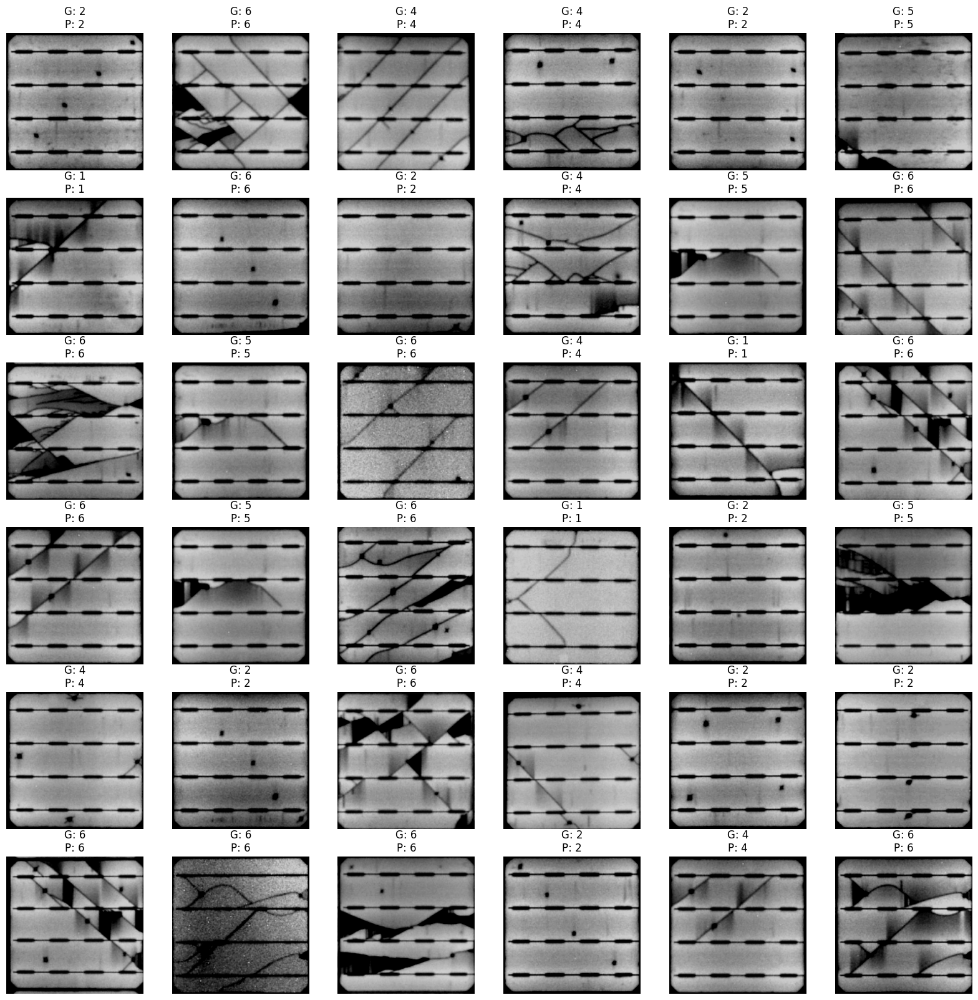

In [33]:
# plot correct samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_val.shape[0], 1, replace=False)
            if ds_val[int(idx[0])]["labels"] > 0 and ds_val[int(idx[0])]["labels"] == predlabels[int(idx[0])]:
                break
        s = ds_val[int(idx[0])]
        ax[i,j].imshow(np.transpose(s['image'], (1,2,0)))
        ax[i,j].set_title(f"G: {s['labels']}\nP: {predictions.label_ids[int(idx[0])]}")
        ax[i,j].axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

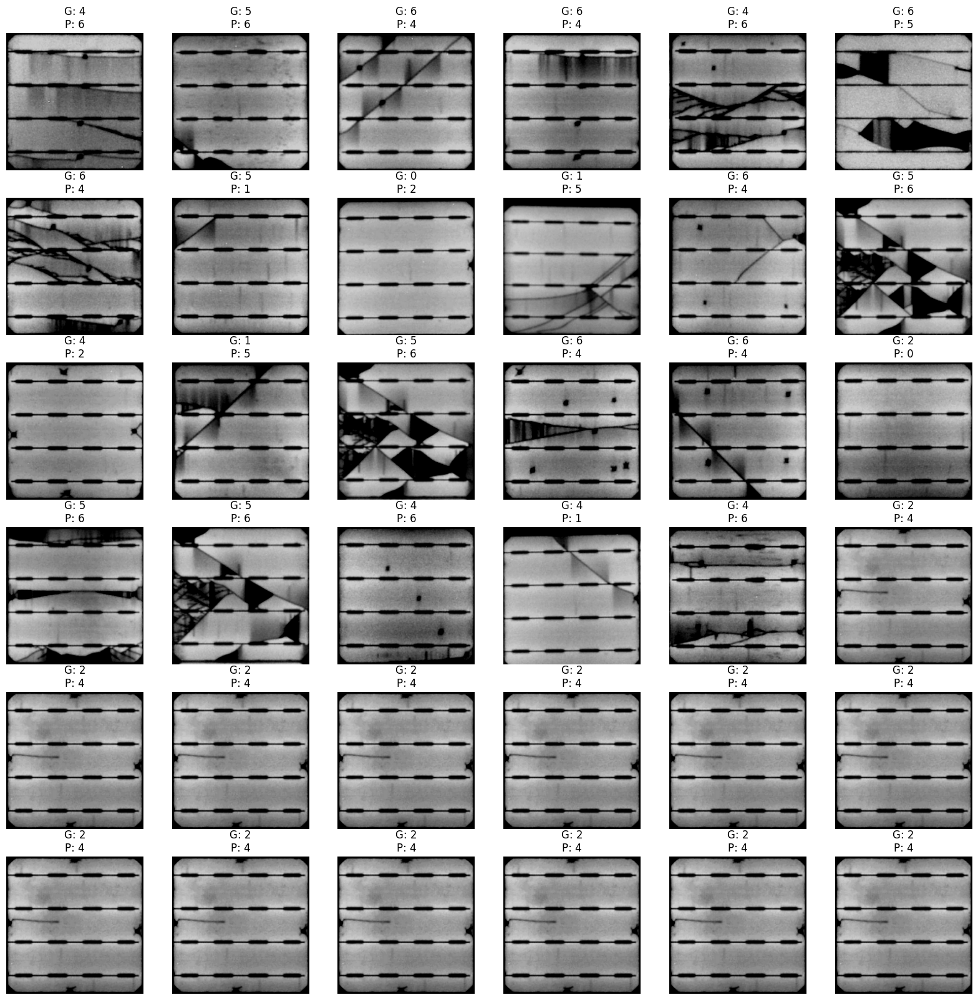

In [24]:
# plot wrong samples
idx = -1
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        for id in np.where(ds_val['labels'] != predlabels)[0]:
            if id > idx:
                idx = int(id)
                break
        if idx > -1:
            s = ds_val[idx]
            ax[i,j].imshow(np.transpose(s['image'], (1,2,0)))
            ax[i,j].set_title(f"G: {s['labels']}\nP: {predlabels[idx]}")
            ax[i,j].axis('off')
plt.show()

# Infinity

In [35]:
#path = "/Users/eagle/Documents/eagle-labelling/features_pickle/Infinity_all_no_pool_labels.pkl"
df_inf = pd.read_pickle(path)
df_inf = df_inf[df_inf.labels >= 0]
df_inf = df_inf[df_inf.labels <= 6]
df_inf_transformed = batch_transform(df_inf)
ds_test = Dataset.from_dict({
                "image": df_inf_transformed.pixel_values,
                "labels": df_inf_transformed.labels
            })
ds_test

/Users/danuta.paraficz/PycharmProjects/eagle-classification/myenv/lib/python3.12/site-packages/transformers/image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `ViTFeatureExtractor.preprocess` and were ignored: 'padding', 'truncation'
  return self.preprocess(images, **kwargs)


Dataset({
    features: ['image', 'labels'],
    num_rows: 10132
})

In [36]:
df_inf.labels.value_counts()

labels
0    5877
6    1744
2     985
4     933
5     407
1     158
3      28
Name: count, dtype: int64

In [37]:
predictions = trainer.predict(ds_test)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

100%|██████████| 634/634 [08:35<00:00,  1.23it/s]


{'test_loss': 0.0817391499876976,
 'test_accuracy': 0.992005527043032,
 'test_f1': 0.9919876124537876,
 'test_runtime': 531.135,
 'test_samples_per_second': 19.076,
 'test_steps_per_second': 1.194}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8352941274642944..0.8274509906768799].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8666666746139526..0.8352941274642944].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8509804010391235..0.8588235378265381].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8274509906768799..0.8117647171020508].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8274509906768799..0.8274509906768799].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8509804010391235..0.8196078538894653].
Clipping input data to

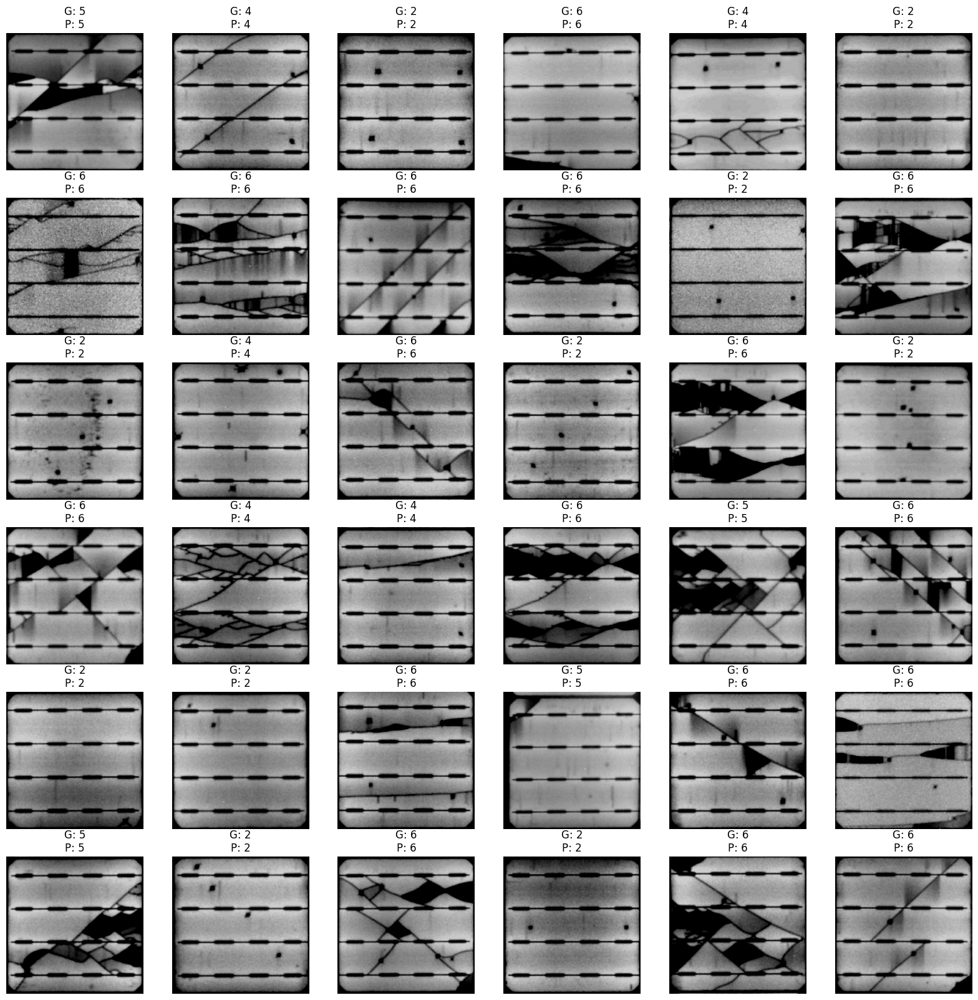

In [38]:
# plot correct samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_test.shape[0], 1, replace=False)
            if ds_test[int(idx[0])]["labels"] > 0 and ds_test[int(idx[0])]["labels"] == predlabels[int(idx[0])]:
                break
        s = ds_test[int(idx[0])]
        ax[i,j].imshow(np.transpose(s['image'], (1,2,0)))
        ax[i,j].set_title(f"G: {s['labels']}\nP: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

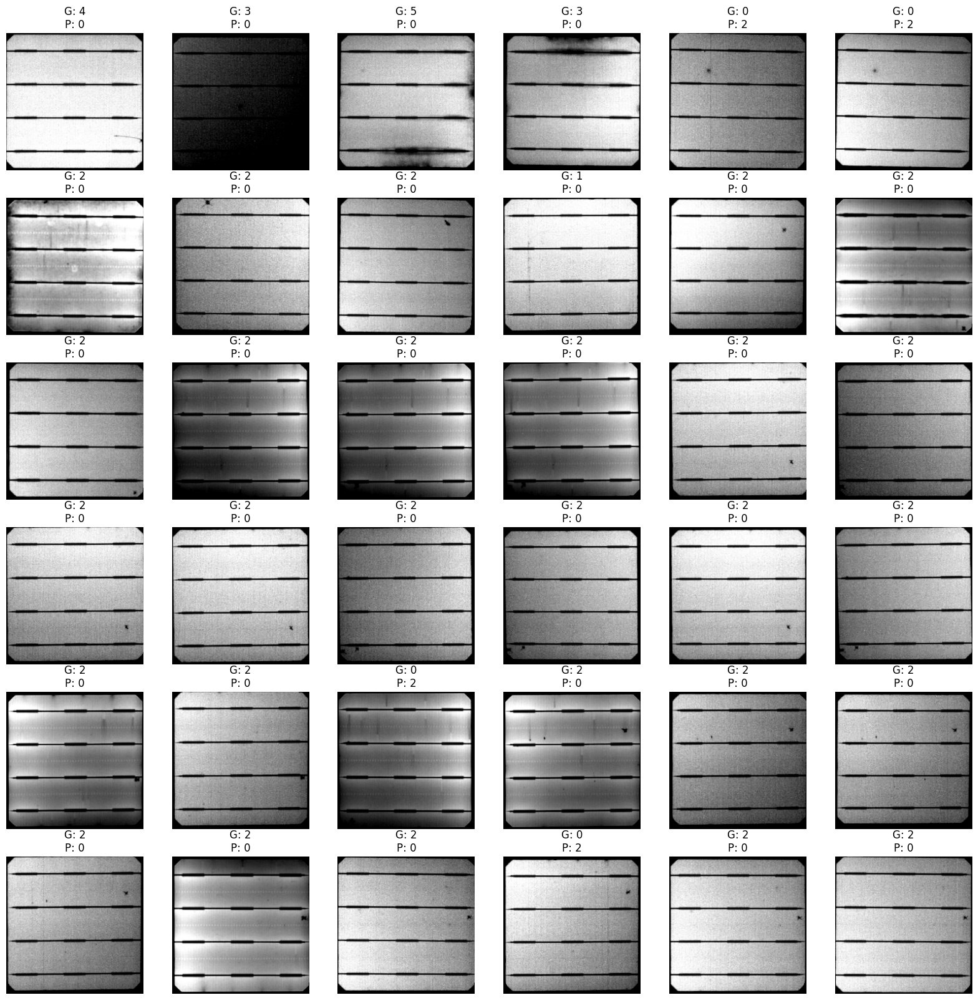

In [29]:
# plot wrong samples
idx = -1
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
for i in range(6):
    for j in range(6):
        for id in np.where(ds_test['labels'] != predlabels)[0]:
            if id > idx:
                idx = int(id)
                break
        if idx > -1:
            s = ds_test[idx]
            ax[i,j].imshow(np.transpose(s['image'], (1,2,0)))
            ax[i,j].set_title(f"G: {s['labels']}\nP: {predlabels[idx]}")
            ax[i,j].axis('off')
plt.show()

# Duramat mono 3 (unlabeled)

In [30]:
path_all = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_no_pool.pkl"
path_all_max = "/Users/eagle/Documents/eagle-labelling/features_pickle/Duramat_all_maxpool.pkl"
df_all = pd.read_pickle(path_all)
df_all_max = pd.read_pickle(path_all_max)
df_mono_3 = df_all.loc[df_all_max["technology"]=="mono_3"]
df_mono_3 = batch_transform(df_mono_3)
ds_mono_3 = Dataset.from_dict({
                "image": df_mono_3.pixel_values,
                "labels": np.zeros(df_mono_3.pixel_values.shape[0])
            })
ds_mono_3

Dataset({
    features: ['image', 'labels'],
    num_rows: 807
})

In [31]:
predictions = trainer.predict(ds_mono_3)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.1862809956073761,
 'test_accuracy': 0.952912019826518,
 'test_f1': 0.9758883248730964,
 'test_runtime': 37.0961,
 'test_samples_per_second': 21.754,
 'test_steps_per_second': 1.375}

In [32]:
np.sum(predlabels != 0)

38

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

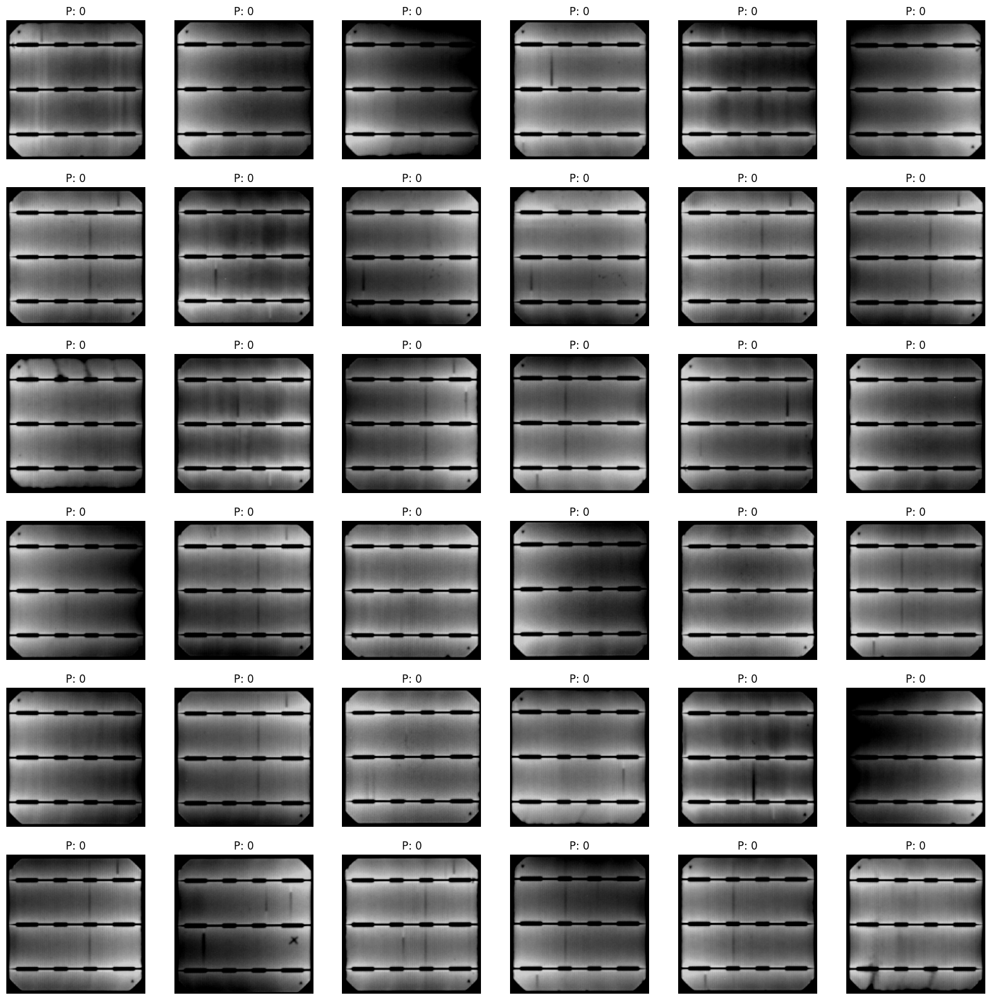

In [33]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

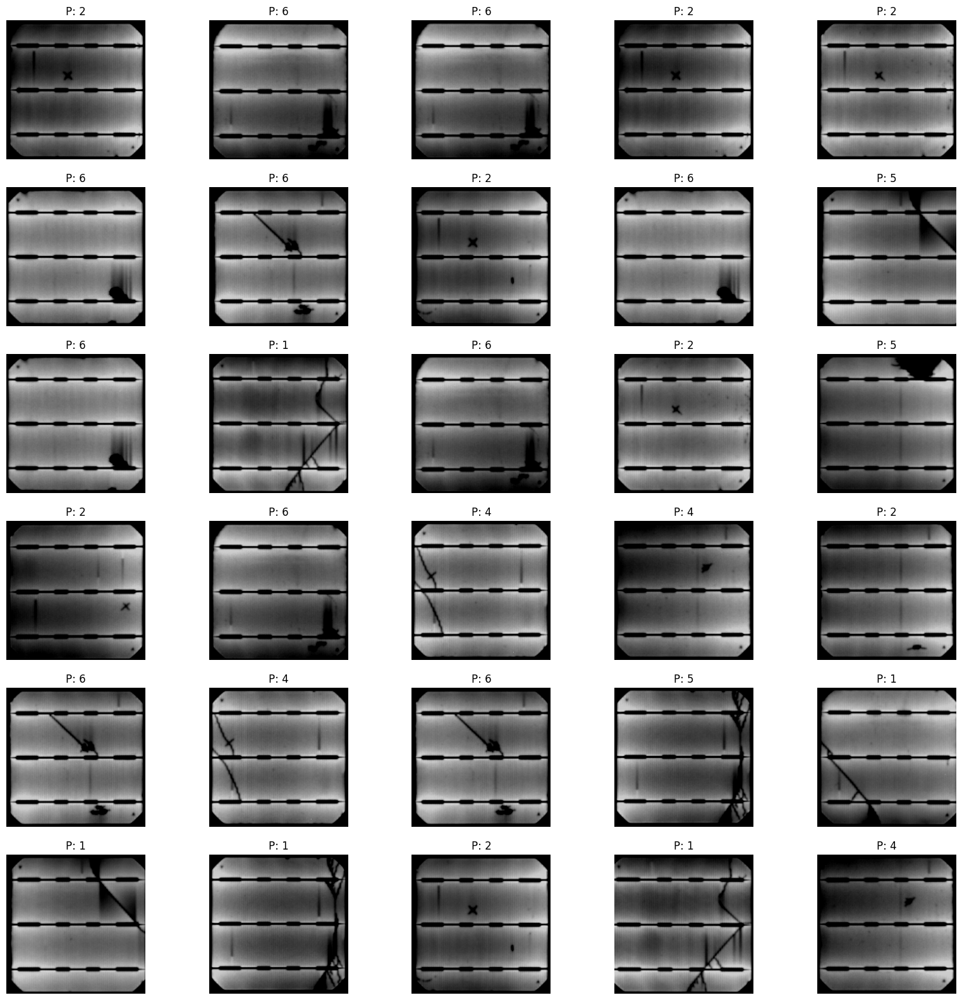

In [34]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_3.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = ds_mono_3[idx]
        ax[i,j].imshow(np.transpose(s['image'][0], (1,2,0)))
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

# Duramat Mono4 (unlabeled)

In [35]:
import tensorflow as tf

In [36]:
def extract_original_images(tf_dataset : tf.data.Dataset) -> np.ndarray:
    '''
    Function for the unsupervised case.
    Extracts the original images from a tf Dataset and saves them into a numpy array for further processing (e.g. with UMAP)
    This function assumes that offset = 0 and crop_size = image_size if cropped == none
    This function assumes it is working with images and not features extracted from images.
    '''
    images = []
    for batch_images in tf_dataset:
            for im in batch_images:
                images.append(np.array(im).astype(int))
 
    return images
 
directory = "/Users/eagle/Library/CloudStorage/OneDrive-SharedLibraries-FFHS/eagle-bfe - data/Webpage/bboxes/duramat_mono4_big"
data_ds_mono4 = tf.keras.utils.image_dataset_from_directory(
            directory=directory,
            labels=None,
            batch_size=128,
            #image_size=image_size,
            seed=42,
            #subset= subset,
            #validation_split=validation_split,
            shuffle = False)
 
original_images = extract_original_images(data_ds_mono4)
 
df_mono_4 = pd.DataFrame(data = {"images" : original_images, "labels": np.zeros(len(original_images))})

df_mono_4 = batch_transform(df_mono_4)
ds_mono_4 = Dataset.from_dict({
                "image": df_mono_4.pixel_values,
                "labels": np.zeros(df_mono_4.pixel_values.shape[0])
            })
ds_mono_4


Found 10500 files.


2024-05-17 20:25:06.630599: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Ultra
2024-05-17 20:25:06.630642: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 128.00 GB
2024-05-17 20:25:06.630645: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 48.00 GB
2024-05-17 20:25:06.630667: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-05-17 20:25:06.630686: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-05-17 20:25:19.929943: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Dataset({
    features: ['image', 'labels'],
    num_rows: 10500
})

In [37]:
predictions = trainer.predict(ds_mono_4)
predlabels = predictions.predictions.argmax(axis=-1)
predictions.metrics

{'test_loss': 0.37890398502349854,
 'test_accuracy': 0.9014285714285715,
 'test_f1': 0.9481592787377912,
 'test_runtime': 462.1176,
 'test_samples_per_second': 22.721,
 'test_steps_per_second': 1.422}

In [38]:
np.sum(predlabels != 0)

1035

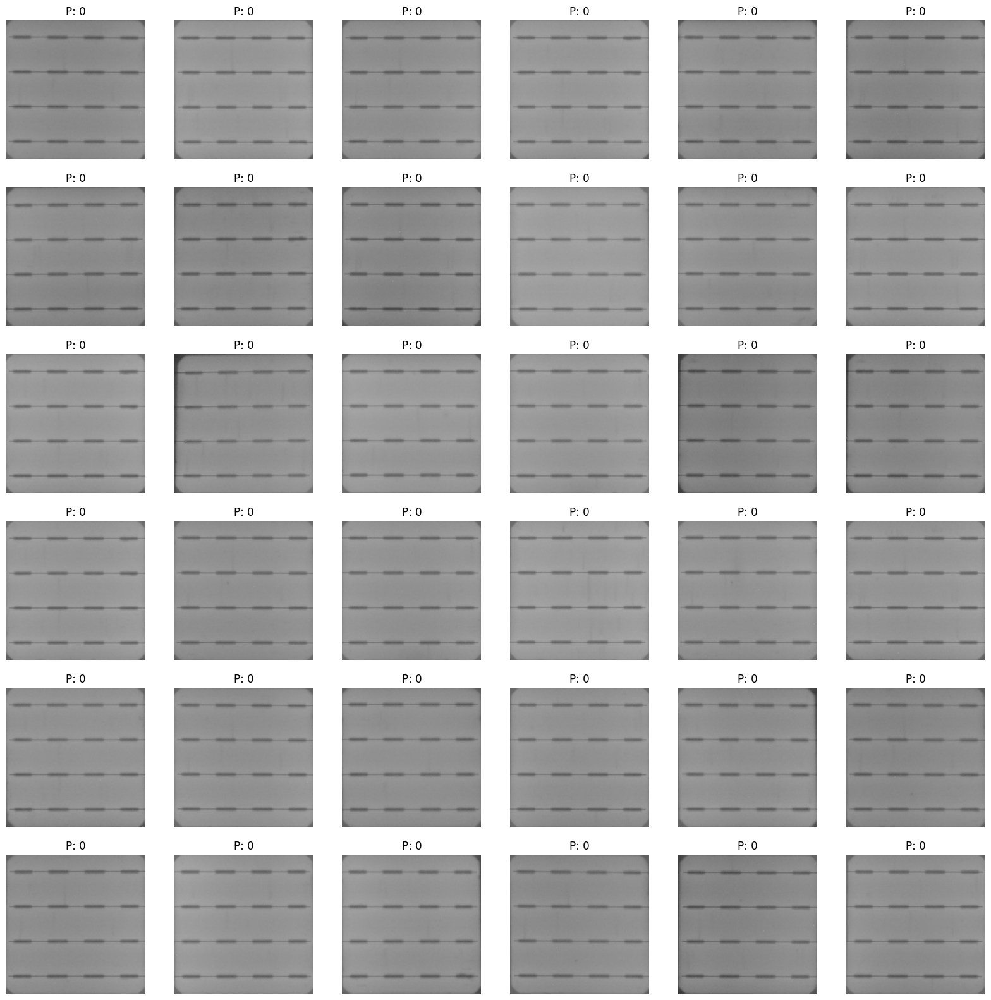

In [41]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(6):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] == 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()

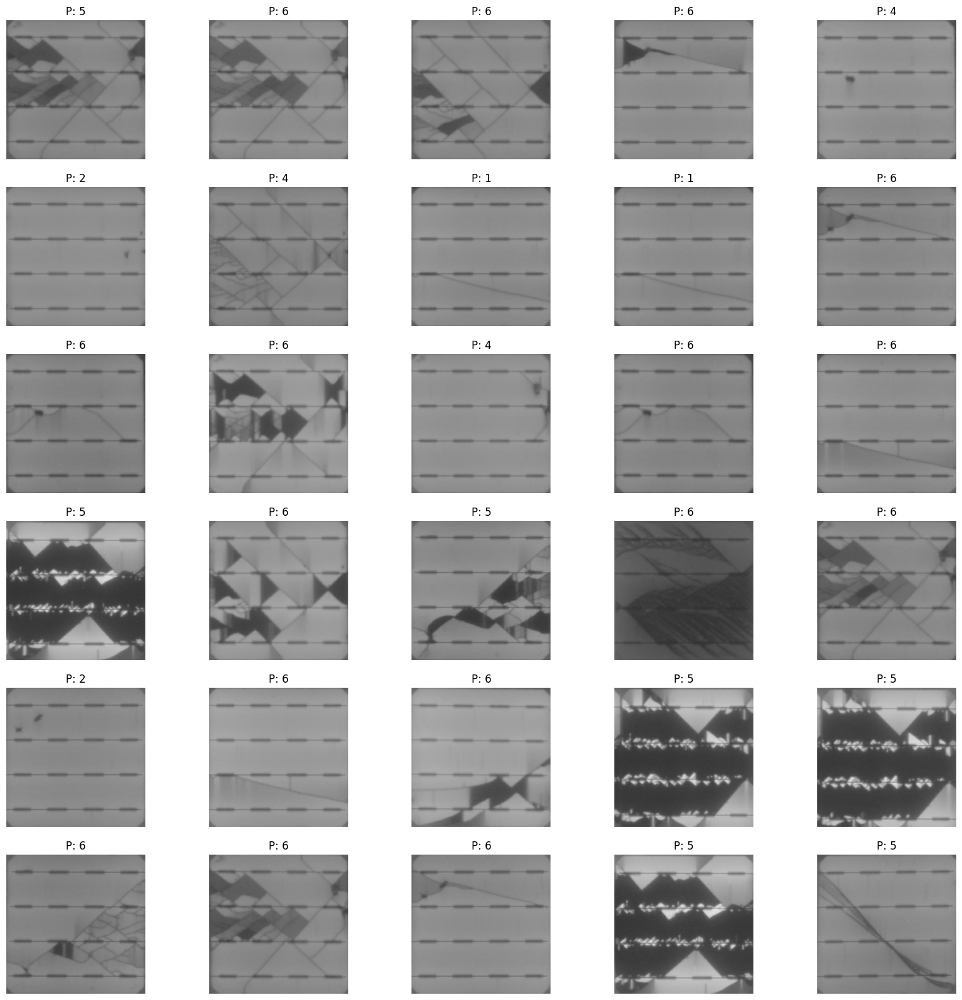

In [42]:
# plot samples
import numpy as np
fig, ax = plt.subplots(6, 5, sharex=True, sharey=True, figsize=(20,20))
used = []
for i in range(6):
    for j in range(5):
        while True:
            idx = np.random.choice(ds_mono_4.shape[0], 1, replace=False)
            if predlabels[int(idx[0])] > 0 and idx not in used:
                used.append(idx)
                break
        s = original_images[int(idx[0])]
        ax[i,j].imshow(s)
        ax[i,j].set_title(f"P: {predlabels[int(idx[0])]}")
        ax[i,j].axis('off')
plt.show()